In [5]:
import pandas as pd
import numpy as np

In [ ]:


main_df = pd.read_csv("../data/Master_data/EDA_ANALYSIS_data.csv")

cluster_df = pd.read_csv("../data/KmeanClustring_And_Evalution_data.csv")



In [ ]:
print(main_df.shape)
print(cluster_df.shape)

print(main_df.columns)
print(cluster_df.columns)

(482117, 75)
(482117, 21)
Index(['shopNo', 'month', 'year', 'noOfRcs', 'noOfTrans', 'riceAfsc',
       'riceFsc', 'riceAap', 'wheat', 'sugar', 'totalAmount',
       'otherShopTransCnt', 'riceAap_available', 'wheat_available', 'totalRcs',
       'totalUnits', 'units', 'distCode', 'distName', 'officeCode',
       'officeName', 'longitude', 'latitude', 'fpsStatus', 'fpsType',
       'dateTime', 'day_name', 'week', 'quarter', 'is_weekend', 'day_of_year',
       'month_start', 'month_end', 'days_in_month', 'utilization_ratio',
       'units_per_card', 'amount_per_transaction', 'amount_per_card',
       'rice_afsc_per_trans', 'rice_fsc_per_trans', 'rice_aap_per_trans',
       'wheat_per_trans', 'rice_to_wheat_ratio', 'sugar_intensity',
       'wheat_intensity', 'rice_share', 'commodity_activity',
       'other_shop_ratio', 'portability_hub_score', 'portability_intensity',
       'high_non_local_flag', 'trans_per_card_FRAUD_DETECTION',
       'units_per_trans_FRAUD_DETECTION', 'fraud_risk_fla

In [8]:
#chaeck Rows are same
print(main_df.shape)
print(cluster_df.shape)

(482117, 75)
(482117, 21)


In [9]:
# Add only Cluster column
main_df['Cluster'] = cluster_df['Cluster'].values

In [ ]:
# Save updated dataset
main_df.to_csv("../data/Final_meaningful_dataset_Clusting.csv", index=False)

print(main_df.head())

In [11]:
# Save dataframe as PKL file
main_df.to_pickle("../models/Final_meaningful_dataset_Clusting.pkl")

print("PKL file saved successfully!")

PKL file saved successfully!


In [12]:
main_df.shape

(482117, 76)

In [13]:
#Step 1: Create Cluster Mean Profile
#his calculates the average behavior of every cluster.
cluster_profile = main_df.groupby('Cluster').mean(numeric_only=True)

print(cluster_profile)

               shopNo     month         year     noOfRcs   noOfTrans  \
Cluster                                                                
0        3.061535e+06  5.696973  2023.720385  283.166207  283.855796   
1        2.933991e+06  5.808211  2023.784705  530.947939  532.022330   
2        2.236031e+06  5.764237  2023.756027  749.308238  752.323020   
3        2.644479e+06  5.756896  2023.750118  440.878275  441.951149   

            riceAfsc       riceFsc    riceAap        wheat      sugar  ...  \
Cluster                                                                ...   
0         836.347031   4869.419251   0.000000     0.099771   0.860493  ...   
1        1185.592025   9411.764759   0.000000     0.055400   2.357148  ...   
2        1207.626601  14078.601860   5.903899  2582.692161  26.112688  ...   
3        1109.810602   7834.167644  24.774488     0.282197   3.640405  ...   

         seasonal_demand  peak_month_flag  festival_quarter  \
Cluster                            

In [14]:
cluster_size = main_df['Cluster'].value_counts().sort_index()

print(cluster_size)

Cluster
0    221558
1    192545
2     36295
3     31719
Name: count, dtype: int64


In [ ]:
important_cols = [
    'noOfRcs',
    'noOfTrans',
    'riceAfsc',
    'riceFsc',
    'riceAap',
    'wheat',
    'sugar',
    'totalAmount',
    'utilization_ratio',
    'transaction_volatility',
    'availability_score',
    'high_performance_shop',
    'low_activity_shop',
    'high_revenue_shop',
    'active_fps',
    'rice_wheat_ratio'
]

cluster_profile = cluster_profile[important_cols]

print(cluster_profile)

In [16]:
#Cluster 0 Profiling 
cluster0 = cluster_profile.loc[0]

print("Cluster 0: Low Activity Rural FPS")

if cluster0['noOfTrans'] < 350:
    print("- Low transaction activity")

if cluster0['low_activity_shop'] > 0.1:
    print("- Underutilized shops")

if cluster0['high_revenue_shop'] < 0.05:
    print("- Low revenue generation")

if cluster0['availability_score'] < 0.01:
    print("- Weak supply network")

print("- Weak demand ecosystem")

Cluster 0: Low Activity Rural FPS
- Low transaction activity
- Underutilized shops
- Low revenue generation
- Weak supply network
- Weak demand ecosystem


In [17]:
#cluster 1 Profiling 
cluster1 = cluster_profile.loc[1]

print("Cluster 1: Stable Semi-Urban FPS")

if cluster1['noOfTrans'] > 400:
    print("- Medium operational activity")

if cluster1['utilization_ratio'] > 0.85:
    print("- Efficient utilization")

if cluster1['active_fps'] > 0.95:
    print("- Stable operational shops")

if cluster1['low_activity_shop'] < 0.05:
    print("- Low inactive shop percentage")

print("- Balanced distribution system")

Cluster 1: Stable Semi-Urban FPS
- Medium operational activity
- Efficient utilization
- Stable operational shops
- Low inactive shop percentage
- Balanced distribution system


In [18]:
#Cluster 2 Profiling 
cluster2 = cluster_profile.loc[2]

print("Cluster 2: High Value Commercial Hub")

if cluster2['noOfTrans'] > 700:
    print("- Very high transaction activity")

if cluster2['high_revenue_shop'] > 0.8:
    print("- High revenue system")

if cluster2['wheat'] > 1000:
    print("- Heavy wheat distribution")

if cluster2['riceFsc'] > 12000:
    print("- Strong rice distribution")

if cluster2['availability_score'] > 1:
    print("- Strong commodity availability")

print("- Critical supply chain node")

Cluster 2: High Value Commercial Hub
- Very high transaction activity
- High revenue system
- Heavy wheat distribution
- Strong rice distribution
- Strong commodity availability
- Critical supply chain node


In [19]:
#Cluster 3 Profiling
cluster3 = cluster_profile.loc[3]

print("Cluster 3: Urban High Performance FPS")

if cluster3['utilization_ratio'] > 0.85:
    print("- Efficient urban system")

if cluster3['active_fps'] > 0.95:
    print("- Stable shop operations")

if cluster3['high_performance_shop'] > 0.1:
    print("- High-performing FPS presence")

if cluster3['availability_score'] > 1:
    print("- Stable supply-demand balance")

print("- Low operational risk environment")


Cluster 3: Urban High Performance FPS
- Efficient urban system
- Stable shop operations
- High-performing FPS presence
- Stable supply-demand balance
- Low operational risk environment


In [20]:
for cluster in cluster_profile.index:

    row = cluster_profile.loc[cluster]

    print("\n" + "="*60)

    if cluster == 0:
        print("Cluster 0: Low Activity Rural FPS")
        print("- Underutilized shops")
        print("- Low transactions")
        print("- Weak demand network")

    elif cluster == 1:
        print("Cluster 1: Stable Semi-Urban FPS")
        print("- Medium activity")
        print("- Balanced operations")
        print("- Stable distribution system")

    elif cluster == 2:
        print("Cluster 2: High Value Commercial Hub")
        print("- Very high transactions")
        print("- High revenue system")
        print("- Critical supply chain nodes")

    elif cluster == 3:
        print("Cluster 3: Urban High Performance FPS")
        print("- Efficient urban system")
        print("- Stable demand-supply balance")
        print("- Low risk environment")


Cluster 0: Low Activity Rural FPS
- Underutilized shops
- Low transactions
- Weak demand network

Cluster 1: Stable Semi-Urban FPS
- Medium activity
- Balanced operations
- Stable distribution system

Cluster 2: High Value Commercial Hub
- Very high transactions
- High revenue system
- Critical supply chain nodes

Cluster 3: Urban High Performance FPS
- Efficient urban system
- Stable demand-supply balance
- Low risk environment


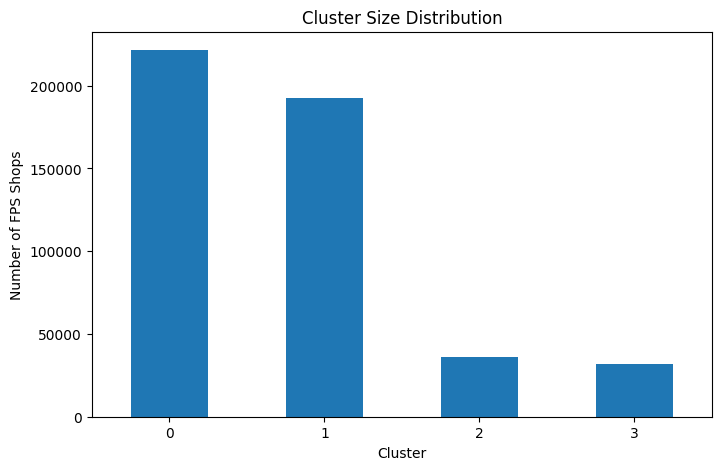

In [21]:
import matplotlib.pyplot as plt

# Cluster count
cluster_size = main_df['Cluster'].value_counts().sort_index()

plt.figure(figsize=(8,5))

cluster_size.plot(kind='bar')

plt.title("Cluster Size Distribution")
plt.xlabel("Cluster")
plt.ylabel("Number of FPS Shops")

plt.xticks(rotation=0)

plt.show()

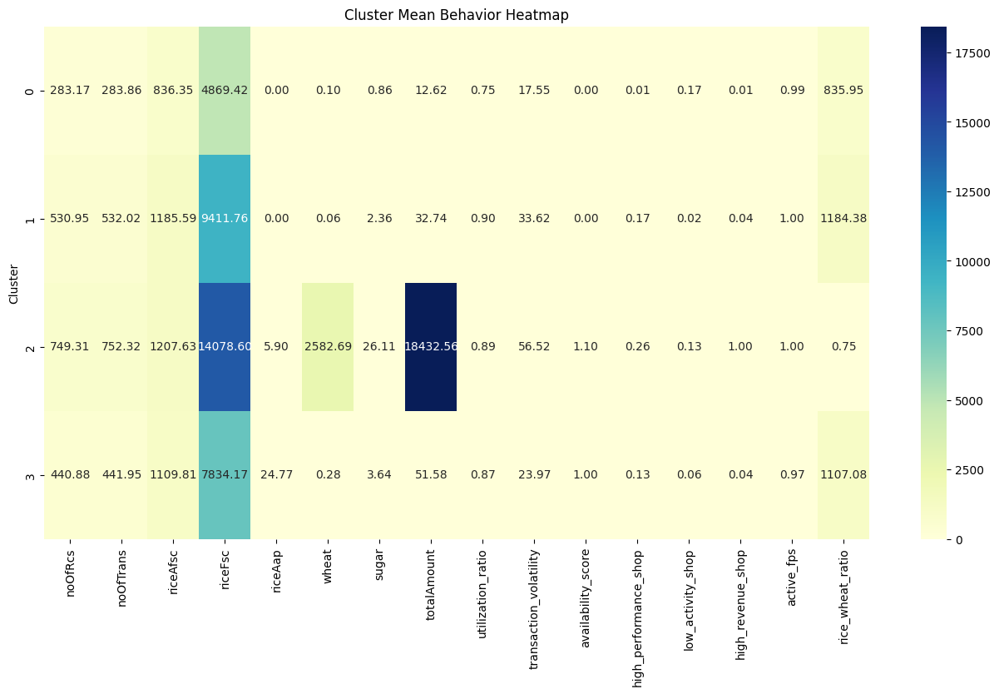

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

important_cols = [
    'noOfRcs',
    'noOfTrans',
    'riceAfsc',
    'riceFsc',
    'riceAap',
    'wheat',
    'sugar',
    'totalAmount',
    'utilization_ratio',
    'transaction_volatility',
    'availability_score',
    'high_performance_shop',
    'low_activity_shop',
    'high_revenue_shop',
    'active_fps',
    'rice_wheat_ratio'
]

# Mean profile
cluster_profile = main_df.groupby('Cluster')[important_cols].mean()

plt.figure(figsize=(16,8))

sns.heatmap(
    cluster_profile,
    annot=True,
    cmap='YlGnBu',
    fmt='.2f'
)

plt.title("Cluster Mean Behavior Heatmap")

plt.show()

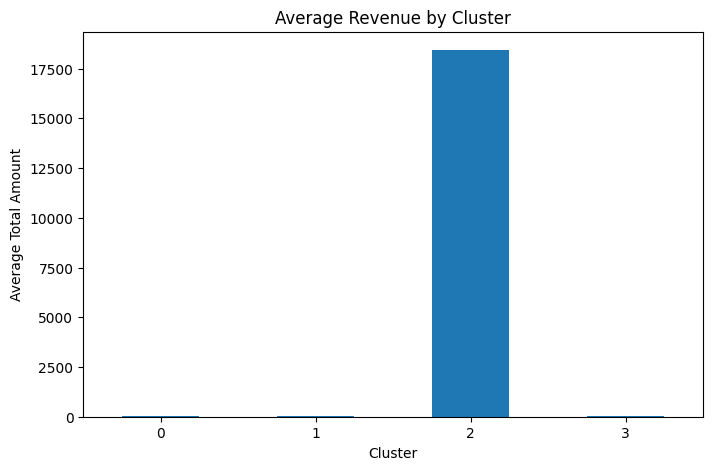

In [23]:
plt.figure(figsize=(8,5))

main_df.groupby('Cluster')['totalAmount'].mean().plot(
    kind='bar'
)

plt.title("Average Revenue by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Average Total Amount")

plt.xticks(rotation=0)

plt.show()

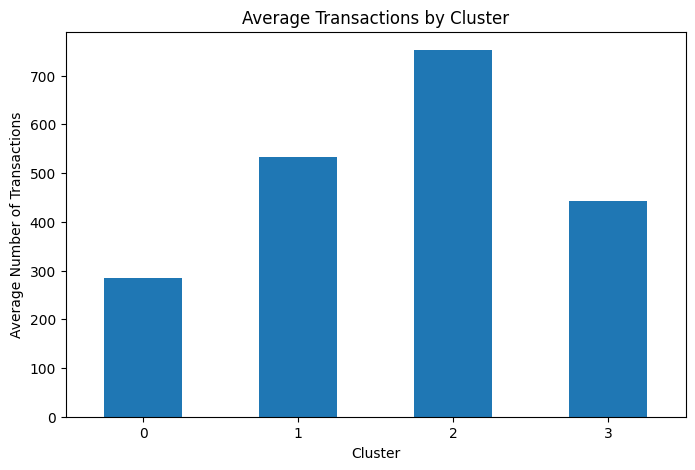

In [24]:
plt.figure(figsize=(8,5))

main_df.groupby('Cluster')['noOfTrans'].mean().plot(
    kind='bar'
)

plt.title("Average Transactions by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Average Number of Transactions")

plt.xticks(rotation=0)

plt.show()

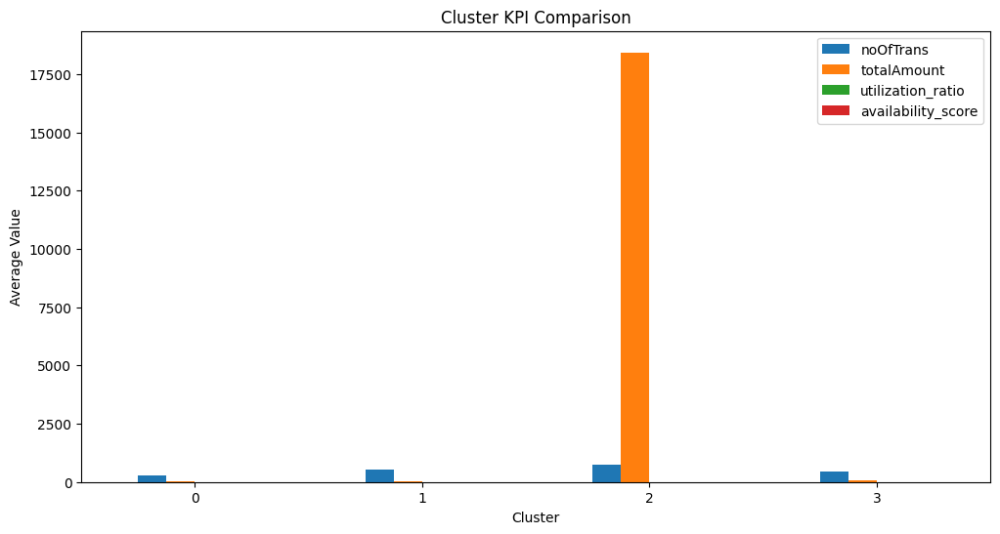

In [25]:
kpi_cols = [
    'noOfTrans',
    'totalAmount',
    'utilization_ratio',
    'availability_score'
]

cluster_profile = main_df.groupby('Cluster')[kpi_cols].mean()

cluster_profile.plot(
    kind='bar',
    figsize=(12,6)
)

plt.title("Cluster KPI Comparison")
plt.xlabel("Cluster")
plt.ylabel("Average Value")

plt.xticks(rotation=0)

plt.show()

In [30]:
fraud_cols = [
    'fraud_risk_flag',
    'transaction_volatility',
    'amount_volatility',
    'trans_per_card_FRAUD_DETECTION',
    'units_per_trans_FRAUD_DETECTION'
]

In [31]:
#Fraud Mean Profile by Cluster
fraud_profile = main_df.groupby('Cluster')[fraud_cols].mean()

print(fraud_profile)

         fraud_risk_flag  transaction_volatility  amount_volatility  \
Cluster                                                               
0               0.000005               17.545913          36.802718   
1               0.016936               33.622099         107.254571   
2               0.035570               56.522021        3708.347102   
3               0.008512               23.967979          79.489641   

         trans_per_card_FRAUD_DETECTION  units_per_trans_FRAUD_DETECTION  
Cluster                                                                   
0                              0.745327                         4.902232  
1                              0.901410                         3.472282  
2                              0.892607                         4.127589  
3                              0.863833                         3.775094  


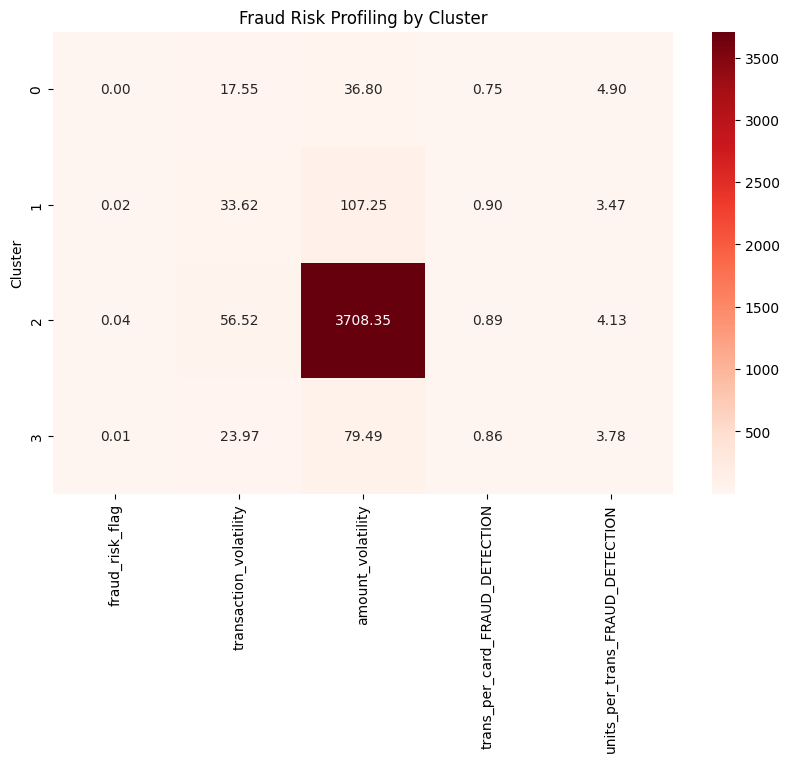

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

sns.heatmap(
    fraud_profile,
    annot=True,
    cmap='Reds',
    fmt='.2f'
)

plt.title("Fraud Risk Profiling by Cluster")

plt.show()

In [33]:
#Fraud Labeling
for cluster in fraud_profile.index:

    row = fraud_profile.loc[cluster]

    print("\n" + "="*50)
    print(f"Cluster {cluster}")

    if row['fraud_risk_flag'] > 0.03:
        print("🚨 High Fraud Risk Cluster")
        print("- Suspicious activity detected")
        print("- High volatility")
        print("- Requires audit")

    elif row['fraud_risk_flag'] > 0.01:
        print(" Medium Fraud Risk Cluster")
        print("- Monitor regularly")
        print("- Moderate anomaly signals")

    else:
        print(" Low Fraud Risk Cluster")
        print("- Stable behavior")
        print("- Low anomaly risk")



Cluster 0
 Low Fraud Risk Cluster
- Stable behavior
- Low anomaly risk

Cluster 1
 Medium Fraud Risk Cluster
- Monitor regularly
- Moderate anomaly signals

Cluster 2
🚨 High Fraud Risk Cluster
- Suspicious activity detected
- High volatility
- Requires audit

Cluster 3
 Low Fraud Risk Cluster
- Stable behavior
- Low anomaly risk


In [34]:
#GEO PROFILING
geo_cols = [
    'urban_proxy',
    'shop_density',
    'longitude',
    'latitude',
    'active_fps',
    'missing_geo_flag'
]

In [35]:
geo_profile = main_df.groupby('Cluster')[geo_cols].mean()

print(geo_profile)

         urban_proxy  shop_density  longitude   latitude  active_fps  \
Cluster                                                                
0           0.435511    590.201378  78.900855  17.628907    0.989610   
1           0.479187    594.525758  78.974734  17.876446    0.995045   
2           0.966690    683.314120  78.471450  17.400335    0.997934   
3           0.525647    585.913238  78.493977  18.091571    0.972824   

         missing_geo_flag  
Cluster                    
0                     0.0  
1                     0.0  
2                     0.0  
3                     0.0  


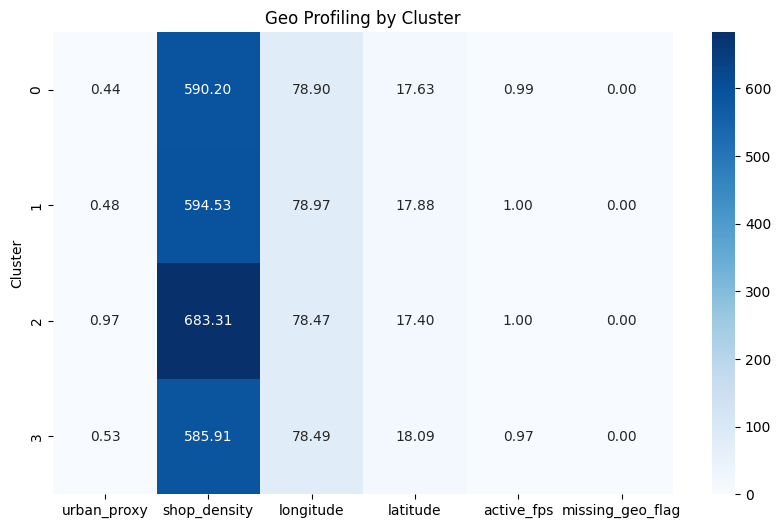

In [36]:
plt.figure(figsize=(10,6))

sns.heatmap(
    geo_profile,
    annot=True,
    cmap='Blues',
    fmt='.2f'
)

plt.title("Geo Profiling by Cluster")

plt.show()

In [37]:
#Urban/Rural Labeling
for cluster in geo_profile.index:

    row = geo_profile.loc[cluster]

    print("\n" + "="*50)
    print(f"Cluster {cluster}")

    if row['urban_proxy'] > 0.7:
        print("Urban High Density Cluster")
        print("- Strong urban presence")
        print("- High shop density")

    elif row['urban_proxy'] > 0.4:
        print("Semi-Urban Cluster")
        print("- Moderate urban influence")
        print("- Balanced density")

    else:
        print(" Rural Cluster")
        print("- Low density region")
        print("- Weak urban influence")



Cluster 0
Semi-Urban Cluster
- Moderate urban influence
- Balanced density

Cluster 1
Semi-Urban Cluster
- Moderate urban influence
- Balanced density

Cluster 2
Urban High Density Cluster
- Strong urban presence
- High shop density

Cluster 3
Semi-Urban Cluster
- Moderate urban influence
- Balanced density


In [38]:
pip install folium

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.1.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [41]:
import matplotlib

colormap = matplotlib.colormaps.get_cmap(
    'tab10'
)

In [42]:
import folium
import matplotlib
import matplotlib.colors as colors
from IPython.display import display

# Sample data
sample_df = main_df.sample(
    10000,
    random_state=42
)

# Center of map
map_center = [
    sample_df['latitude'].mean(),
    sample_df['longitude'].mean()
]

# Create map
m = folium.Map(
    location=map_center,
    zoom_start=6
)

# Unique clusters
unique_clusters = sample_df['Cluster'].unique()

# New colormap method
colormap = matplotlib.colormaps.get_cmap(
    'tab10'
)

# Add markers
for _, row in sample_df.iterrows():

    cluster = int(row['Cluster'])

    # Noise cluster
    if cluster == -1:
        color = 'black'
    else:
        color = colors.rgb2hex(
            colormap(
                cluster % 10
            )
        )

    folium.CircleMarker(
        location=[
            row['latitude'],
            row['longitude']
        ],
        radius=2,
        color=color,
        fill=True,
        fill_opacity=0.6,
        popup=f"Cluster: {cluster}"
    ).add_to(m)

# Show map
display(m)

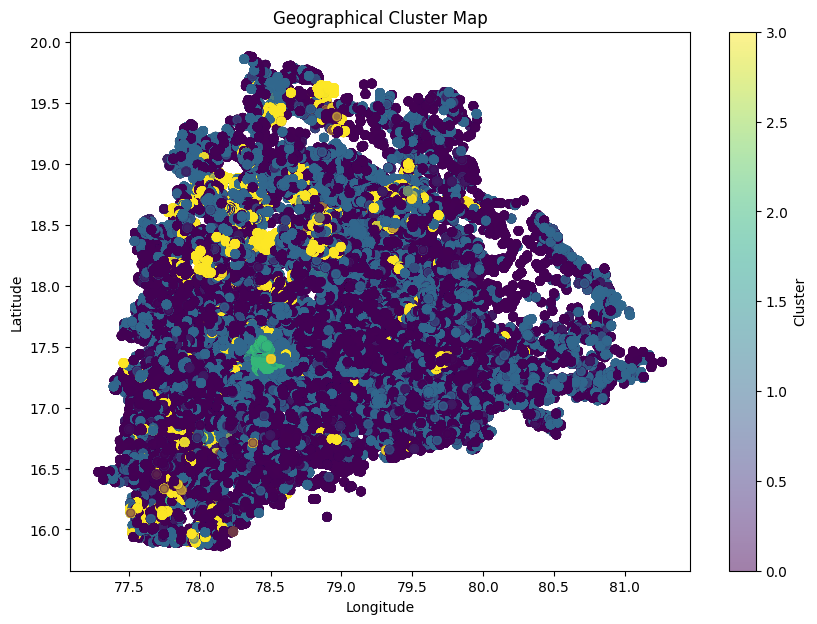

In [ ]:
plt.figure(figsize=(10,7))

scatter = plt.scatter(
    main_df['longitude'],
    main_df['latitude'],
    c=main_df['Cluster'],
    alpha=0.5
)

plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.title("Geographical Cluster Map")

plt.colorbar(label="Cluster")

plt.show()


#Polt over Map----

In [ ]:
cluster_profile.to_csv(
    "Final_Cluster_Profile.csv"
)

print("Cluster profile saved successfully")